In [1]:
# WRITTEN BY ALAN LI
# NASA AMES LABORATORY FOR ADVANCED SENSING (LAS)
# Last edited: Oct 29, 2018
%matplotlib notebook

import sys
sys.path.append("./utils/") # Adds higher directory to python modules path.
import random
import numpy as np
import cv2
import glob, os
from collections import Counter
from skimage.measure import compare_ssim as ssim

from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import colors
from collections import Counter
import pandas as pd
import logging
import yaml
import json
from PIL import Image as pil_image
import scipy
from osgeo import gdal, ogr, osr

import tensorflow as tf
from tensorflow.python.client import device_lib
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

import loadcoraldata_utils as coralutils
import keras
import keras.backend as K
from keras import backend
from keras.models import Model, Sequential, load_model
from keras.utils import np_utils
from keras import optimizers
from keras.preprocessing.image import img_to_array, load_img
from keras.callbacks import Callback
from keras.losses import mean_squared_error
from keras.utils.np_utils import to_categorical
from keras.models import Model

from NeMO_models import FCN
from NeMO_losses import charbonnierLoss
import NeMO_layers
import NeMO_encoders
from NeMO_generator import NeMOImageGenerator, ImageSetLoader
from NeMO_callbacks import CheckNumericsOps, WeightsSaver

num_cores = 4
num_GPU = 1
num_CPU = 1

global _SESSION
config = tf.ConfigProto(intra_op_parallelism_threads=num_cores,
        inter_op_parallelism_threads=num_cores, allow_soft_placement=True,
        device_count = {'CPU' : num_CPU, 'GPU' : num_GPU})
_SESSION = tf.Session(config=config)
K.set_session(_SESSION)

%matplotlib notebook

# model = load_model('./tmp/SR_FeatureWise.h5', custom_objects={'BilinearUpSampling2D':NeMO_layers.BilinearUpSampling2D, 
#                                                     'charbonnierLoss': charbonnierLoss})
# model = load_model('./tmp/SRx2_Fiji_4channel_EDSR.h5', custom_objects={'PixelShuffler':NeMO_layers.PixelShuffler, 'BilinearUpSampling2D':NeMO_layers.BilinearUpSampling2D, 'charbonnierLoss': charbonnierLoss})

model = load_model('./tmp/SRx2_4channel_GAN.h5', custom_objects={'PixelShuffler':NeMO_layers.PixelShuffler, 'BilinearUpSampling2D':NeMO_layers.BilinearUpSampling2D, 'charbonnierLoss': charbonnierLoss})



# Jarrett_4channel_model = load_model('./tmp/RefineMask_Jarrett256_RGB_NIR.h5', 
#                                     custom_objects={'BilinearUpSampling2D':NeMO_layers.BilinearUpSampling2D, 'charbonnierLoss': charbonnierLoss})

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
Using TensorFlow backend.


Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [2]:
# Extra step for SR Featurewise model
model.summary()
# Input = model.get_layer("model_1").get_input_at(0)
# SR_layer = model.get_layer("model_1").get_output_at(0)

# print("Cut Model:")
# supermodel = Model(Input, SR_layer)
# supermodel.summary()


____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 128, 128, 4)   0                                            
____________________________________________________________________________________________________
vgg_convblock1_conv1 (Conv2D)    (None, 128, 128, 64)  2368        input_1[0][0]                    
____________________________________________________________________________________________________
vgg_convblock2_par1_str1_par1_co (None, 128, 128, 64)  36928       vgg_convblock1_conv1[0][0]       
____________________________________________________________________________________________________
vgg_convblock2_par1_str1_par1_Ac (None, 128, 128, 64)  0           vgg_convblock2_par1_str1_par1_con
___________________________________________________________________________________________

In [3]:
def loadrasterRGB(filepath,channels):
    img = gdal.Open(filepath)

    xsize = img.RasterXSize
    ysize = img.RasterYSize

    image = np.zeros((ysize,xsize,len(channels)))

    for band in range(len(channels)):
        imgband = img.GetRasterBand(channels[band])
        image[:,:,band] = imgband.ReadAsArray()
    return image

def fixRGBimg(img,pixel_mean,pixel_std,minval,maxval):
    fixed_img = img
    fixed_img = fixed_img*pixel_std+pixel_mean
    fixed_img[fixed_img > maxval] = maxval
    fixed_img[fixed_img < minval] = minval
    fixed_img = np.asarray(fixed_img, dtype=np.uint8)
    return fixed_img

def raster_lores(filepath, downscale):
    img = gdal.Open(filepath)
    xsize = img.RasterXSize
    ysize = img.RasterYSize
    channels = img.RasterCount
     
    downscalesize_x = int(xsize*downscale)
    downscalesize_y = int(ysize*downscale)
    
    lores_image = np.zeros((downscalesize_y, downscalesize_x, channels))
    
    for band in range(channels):
        imgband = img.GetRasterBand(band+1).ReadAsArray()
        lores_image_channel = scipy.misc.imresize(imgband, downscale, mode='F')
        lores_image[:,:,band] = lores_image_channel
        
    return lores_image

def classifyback(predictions):
    return np.argmax(predictions,-1)

In [4]:
# 4 channel code for Sentinel data
filepath_Sentinel = "/home/shared/NeMO-Net Data/Sentinel/Cicia/STL_4band_2016-01-17.tif"
filepath_Sentinel_cloudmask = "/home/shared/NeMO-Net Data/Sentinel/Cicia/STL_Cloud_2016-01-17.tif"
# Fiji_Sentinel = coralutils.CoralData(filepath_Sentinel, load_type="raster")
Fiji_Sentinel = coralutils.CoralData(filepath_Sentinel, Truthpath=filepath_Sentinel_cloudmask, load_type="raster")

# Just some visualizations of RGB
patch_R = 255/3000*Fiji_Sentinel.image[:,:,0]
patch_G = 255/3000*Fiji_Sentinel.image[:,:,1]
patch_B = 255/3000*Fiji_Sentinel.image[:,:,2]
patch_R[patch_R > 255] = 255
patch_G[patch_G > 255] = 255
patch_B[patch_B > 255] = 255
Fiji_RGB = np.rollaxis(np.asarray([patch_R, patch_G, patch_B], dtype=np.uint8),0,3)

fig = plt.figure(1,figsize=(12,5))
ax = plt.subplot(1,2,1)
ax.imshow(Fiji_RGB)
ax = plt.subplot(1,2,2)
ax.imshow(Fiji_Sentinel.truthimage)
plt.show()

ymin = 680
xmin = 180
l = 64
samplepatch_RGB = Fiji_Sentinel.image[ymin:ymin+l,xmin:xmin+l,:3]
samplepatch_RGB = np.asarray(np.clip(255/3000*samplepatch_RGB,0,255), dtype=np.uint8)
# Turn patch into standardized BGR + NIR
pixel_mean = 1500
pixel_std = 1500
samplepatch = np.dstack((Fiji_Sentinel.image[ymin:ymin+l,xmin:xmin+l,2::-1],Fiji_Sentinel.image[ymin:ymin+l,xmin:xmin+l,-1])) #BGR+NIR
# samplepatch = Fiji_Sentinel.image[ymin:ymin+l,xmin:xmin+l,:]
samplepatch = img_to_array(samplepatch, data_format=K.image_data_format())
samplepatch = (samplepatch-pixel_mean)/pixel_std
imgresize = scipy.misc.imresize(samplepatch_RGB,400,'bilinear')

fig = plt.figure(2, figsize=(15,5))
ax = plt.subplot(1,5,1)
ax.imshow(samplepatch_RGB)
ax.set_title('Sentinel Lores')

# imgresize = fixRGBimg(imgresize,100,100,0,255)
ax = plt.subplot(1,5,2)
ax.set_title('Bilinear')
ax.imshow(imgresize)

imgbatch = np.expand_dims(samplepatch, axis=0)
imgpredict = supermodel.predict(imgbatch, batch_size = 1)[0]
kernel_sharpening = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
imgpredict_sharpen = np.zeros(imgpredict.shape)
for i in range(4):
    imgpredict_sharpen[:,:,i] = cv2.filter2D(imgpredict[:,:,i], -1, kernel_sharpening)
# imgpredict_sharpen = np.dstack((imgpredict_sharpen[:,:,2::-1],imgpredict_sharpen[:,:,-1])) #RGB+NIR

imgpredict = fixRGBimg(imgpredict,100,100,0,255)
imgpredict_fix = np.zeros((imgpredict.shape[0],imgpredict.shape[1],4))
imgpredict_fix[:,:,0] = imgpredict[:,:,2]
imgpredict_fix[:,:,1] = imgpredict[:,:,1]
imgpredict_fix[:,:,2] = imgpredict[:,:,0]
imgpredict_fix[:,:,3] = imgpredict[:,:,3]
imgpredict_fix = np.asarray(imgpredict_fix, dtype=np.uint8)

ax = plt.subplot(1,5,3)
ax.imshow(imgpredict_fix[:,:,:3])
ax.set_title('SRx4')

ax = plt.subplot(1,5,4)
ax.imshow(fixRGBimg(imgpredict_sharpen[:,:,2::-1],100,100,0,255))
ax.set_title('SRx4_sharpen')

imgsharpen_predictbatch = np.expand_dims(imgpredict_sharpen, axis=0)
SR_sharpen_predict = Jarrett_4channel_model.predict(imgsharpen_predictbatch, batch_size = 1)[0] # Taking BGR + NIR data
SR_sharpen_predict = np.reshape(classifyback(SR_sharpen_predict), (256,256))

cmap_Ved = colors.ListedColormap(['xkcd:pink', 'xkcd:grey', 'xkcd:tan', 'xkcd:olive', 'xkcd:forest', 'xkcd:blue',
                                'xkcd:lilac', 'xkcd:cyan', 'xkcd:orange'])
bounds = [i-0.5 for i in range(len(cmap_Ved.colors)+1)] # assumes labels start at 0
norm = colors.BoundaryNorm([b+0.5 for b in bounds], cmap_Ved.N)
ax = plt.subplot(1,5,5)
ax.imshow(SR_sharpen_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)
plt.show()

Warning! Truth image not in expected format... loading directly whole image using cv2...


<IPython.core.display.Javascript object>

/home/asli/NeMO-Test/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


<IPython.core.display.Javascript object>

NameError: name 'supermodel' is not defined

Class:  Urban


/home/asli/NeMO-Test/lib/python3.6/site-packages/ipykernel_launcher.py:31: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/asli/NeMO-Test/lib/python3.6/site-packages/ipykernel_launcher.py:32: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


<IPython.core.display.Javascript object>


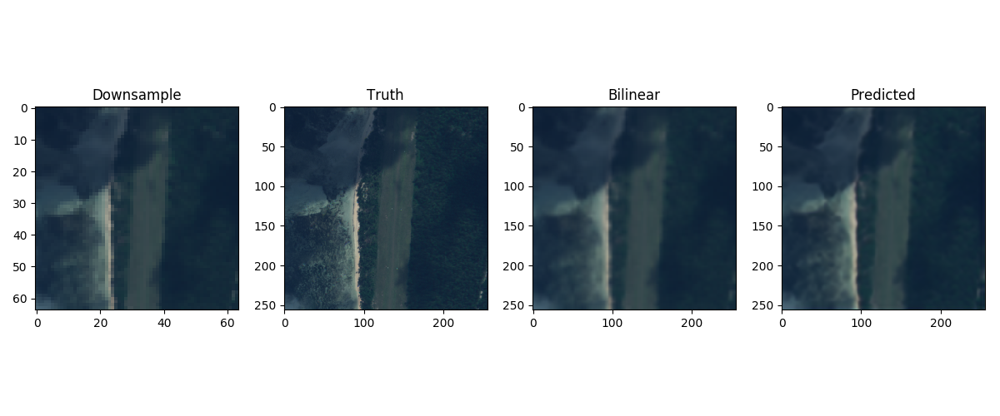

MSE, PSNR and SSIM for NN predicted:  109.70603942871094 27.728498242834885 0.7964146264272619
MSE, PSRN for SSIM Bilinear upsampling:  116.56158447265625 27.465249185107954 0.7730788856205306
Class:  Mud flats


<IPython.core.display.Javascript object>


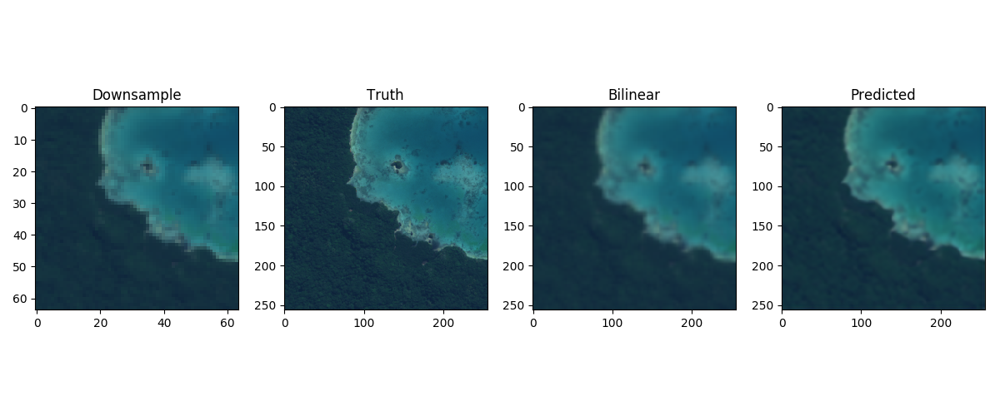

MSE, PSNR and SSIM for NN predicted:  130.2764434814453 26.98214466958082 0.7480845506864606
MSE, PSRN for SSIM Bilinear upsampling:  113.399169921875 27.584704853204464 0.7745250740993811
Class:  Dense macroalgae on sediment


<IPython.core.display.Javascript object>


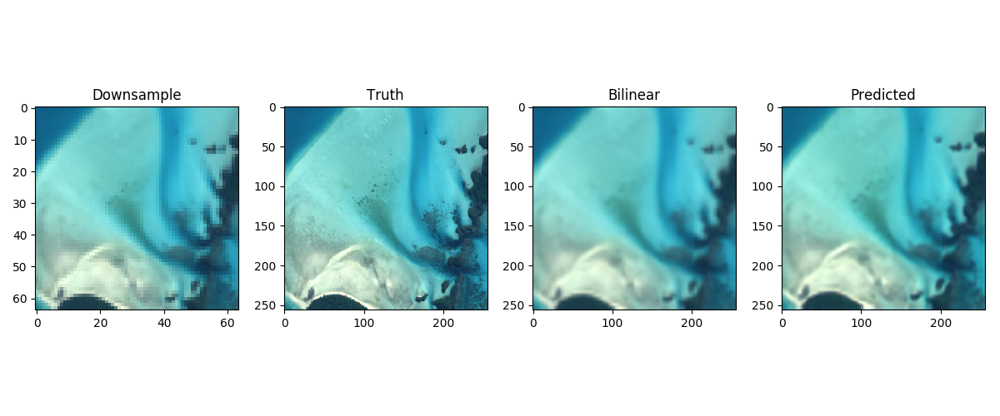

MSE, PSNR and SSIM for NN predicted:  184.18226623535156 25.4783254850812 0.7255768660073164
MSE, PSRN for SSIM Bilinear upsampling:  110.71284484863281 27.688823504384622 0.8467869563210366
Class:  Lagoonal pinnacle reefs massive coral dominated


<IPython.core.display.Javascript object>


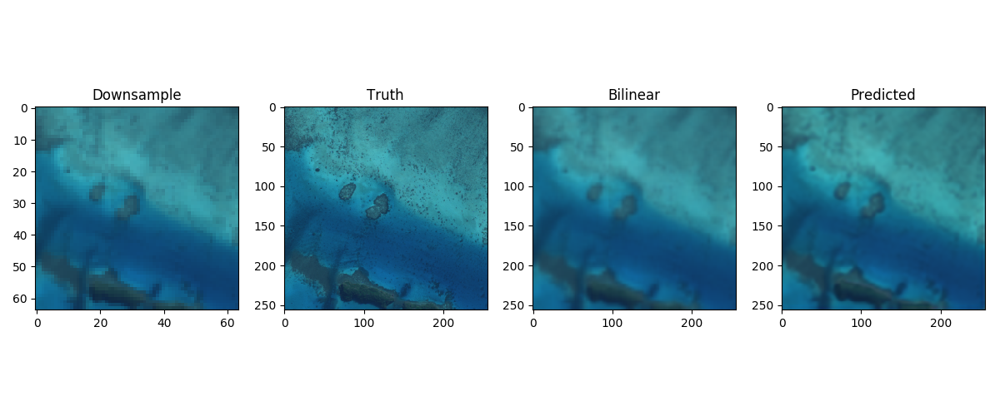

MSE, PSNR and SSIM for NN predicted:  104.77828979492188 27.928090553099988 0.7864605157877517
MSE, PSRN for SSIM Bilinear upsampling:  76.73435974121094 29.28090487080558 0.8266393668576705
Class:  Deep ocean water


<IPython.core.display.Javascript object>


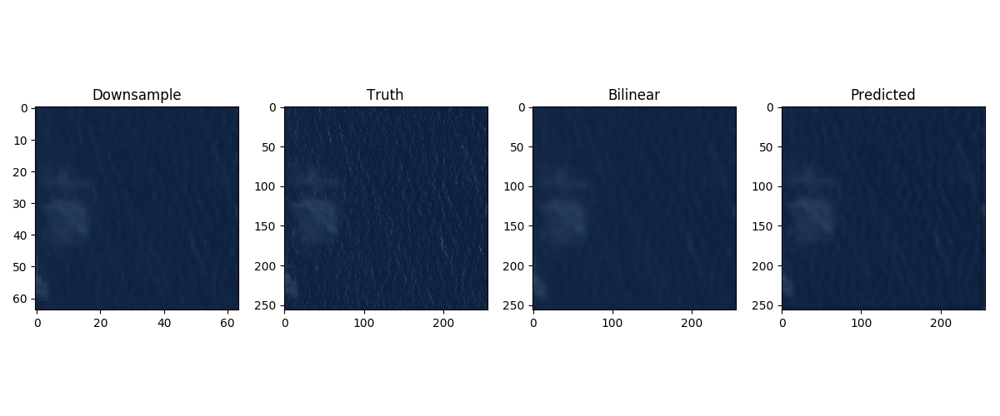

MSE, PSNR and SSIM for NN predicted:  66.85896301269531 29.879207244976417 0.784975568216703
MSE, PSRN for SSIM Bilinear upsampling:  56.66954040527344 30.59730670376812 0.8018878967635521
Class:  Fore reef sand flats


<IPython.core.display.Javascript object>


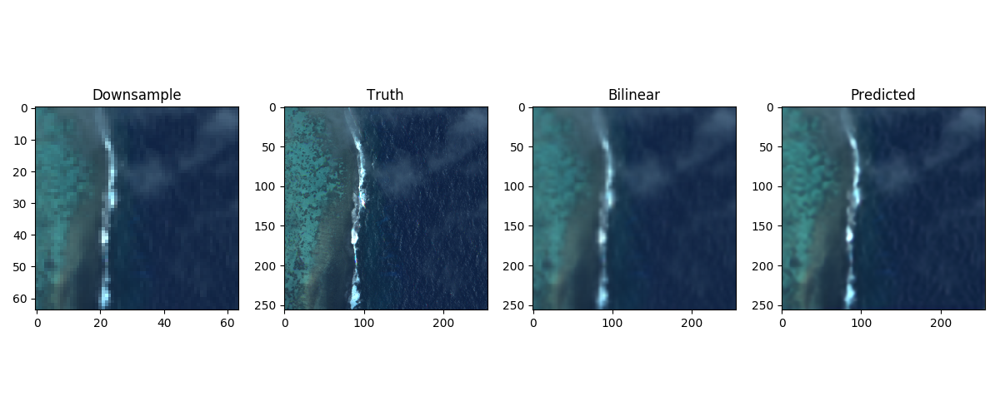

MSE, PSNR and SSIM for NN predicted:  154.31488037109375 26.246725543675524 0.6508218069294613
MSE, PSRN for SSIM Bilinear upsampling:  106.1900634765625 27.8699648046138 0.7510034651297579
Class:  Deep fore reef slope


<IPython.core.display.Javascript object>


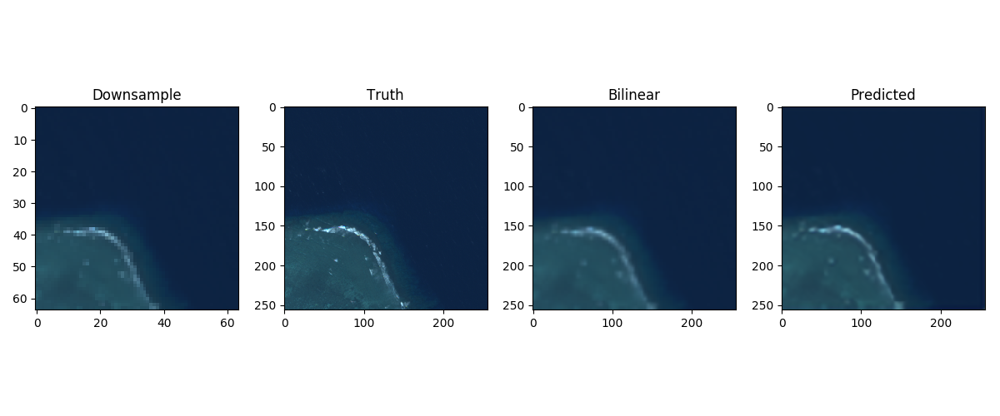

MSE, PSNR and SSIM for NN predicted:  31.868988037109375 33.09712087694678 0.9360578406428215
MSE, PSRN for SSIM Bilinear upsampling:  24.49664306640625 34.23973786610476 0.937686734709637
Class:  Dense seagrass meadows


<IPython.core.display.Javascript object>


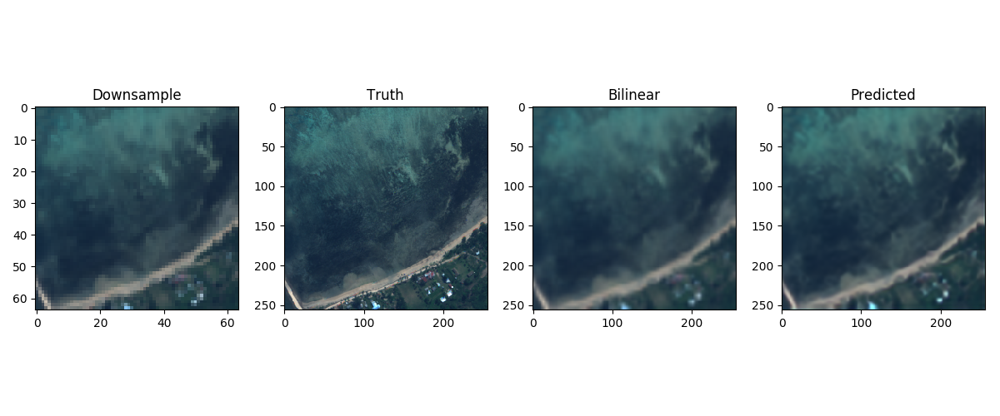

MSE, PSNR and SSIM for NN predicted:  113.382568359375 27.58534070396143 0.7974858380430506
MSE, PSRN for SSIM Bilinear upsampling:  140.8879852294922 26.642064023292917 0.7398442087571415
Class:  Back reef sediment dominated


<IPython.core.display.Javascript object>


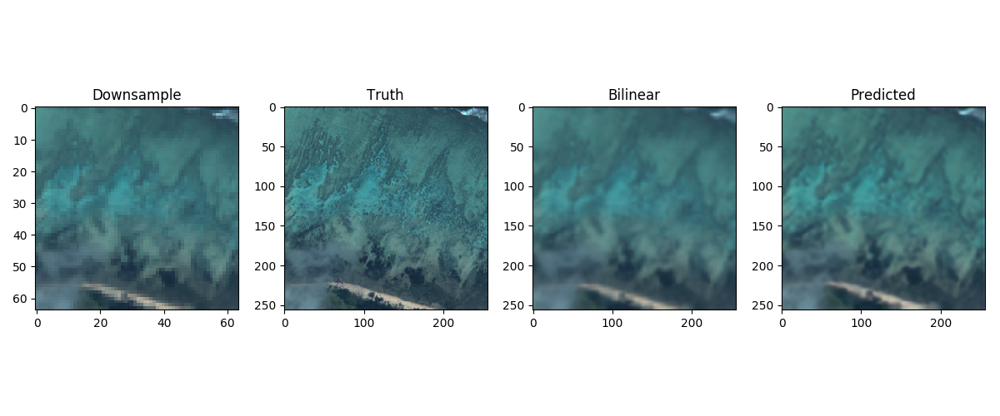

MSE, PSNR and SSIM for NN predicted:  121.79591369628906 27.27447643087663 0.7834607369847066
MSE, PSRN for SSIM Bilinear upsampling:  163.42303466796875 25.99767090041572 0.6860931869787543
Class:  NoData


<IPython.core.display.Javascript object>


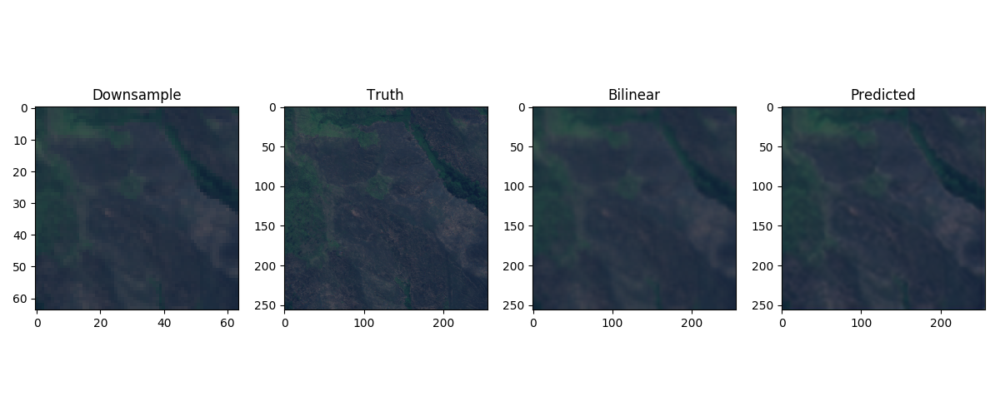

MSE, PSNR and SSIM for NN predicted:  93.30307006835938 28.431844267482976 0.8015431463769354
MSE, PSRN for SSIM Bilinear upsampling:  82.53207397460938 28.964576020979422 0.8131298141755561
Class:  Inland waters


<IPython.core.display.Javascript object>


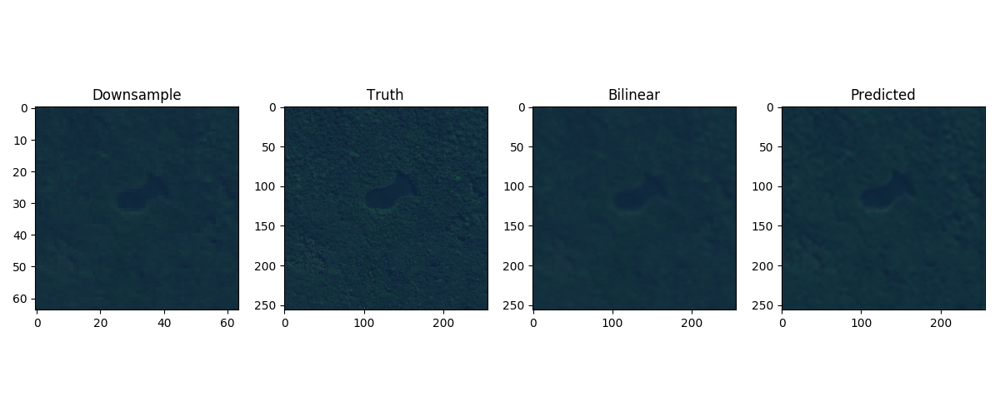

MSE, PSNR and SSIM for NN predicted:  135.46287536621094 26.812600710649708 0.7267448985204574
MSE, PSRN for SSIM Bilinear upsampling:  133.11929321289062 26.88839357769792 0.6917942020238644
Class:  Lagoonal floor bommie field


<IPython.core.display.Javascript object>


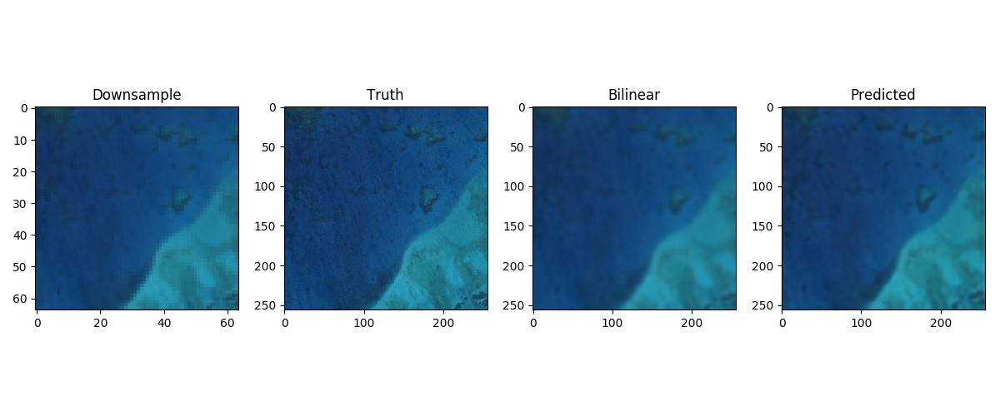

MSE, PSNR and SSIM for NN predicted:  62.335784912109375 30.18342928523843 0.8712688535310655
MSE, PSRN for SSIM Bilinear upsampling:  52.55696105957031 30.924501152982103 0.8745080696702663
Class:  Back reef rubble dominated


<IPython.core.display.Javascript object>


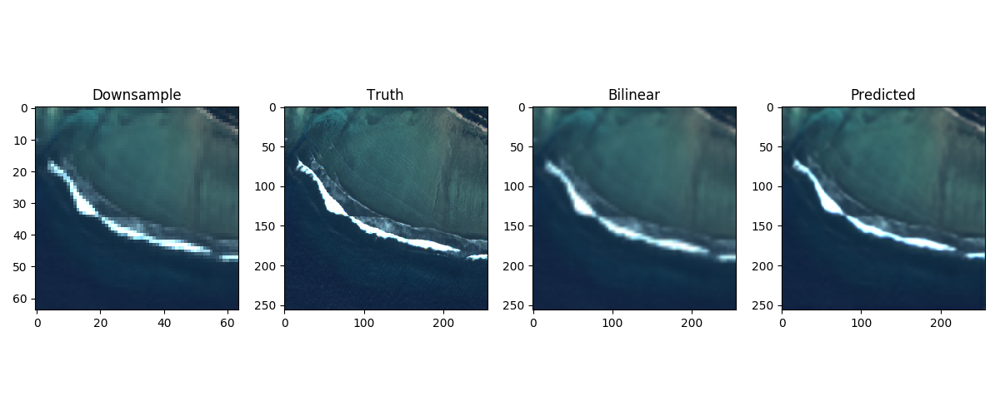

MSE, PSNR and SSIM for NN predicted:  83.84231567382812 28.896170961128355 0.8444483524387598
MSE, PSRN for SSIM Bilinear upsampling:  79.38554382324219 29.133389366448057 0.8492928804561478
Class:  Lagoonal patch reefs


<IPython.core.display.Javascript object>


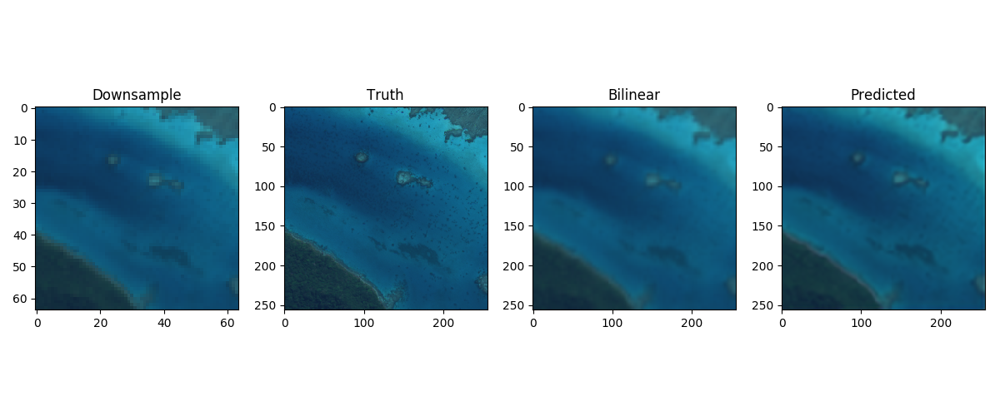

MSE, PSNR and SSIM for NN predicted:  59.05317687988281 30.418370945781522 0.8937671859016509
MSE, PSRN for SSIM Bilinear upsampling:  61.54103088378906 30.23915593958238 0.8739264426407836
Class:  Lagoonal floor coral bommies


<IPython.core.display.Javascript object>


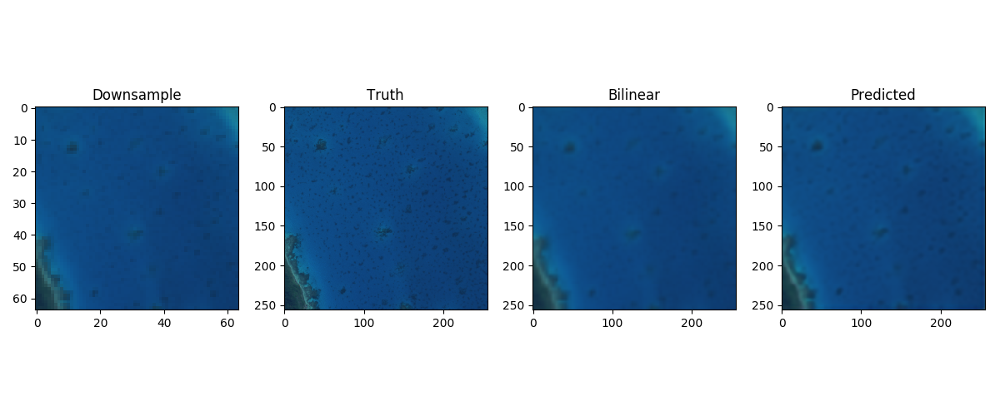

MSE, PSNR and SSIM for NN predicted:  43.39219665527344 31.7566872477151 0.8981430449664956
MSE, PSRN for SSIM Bilinear upsampling:  40.98786926269531 32.0042501858229 0.8838186836660489
Class:  Lagoonal fringing reefs


<IPython.core.display.Javascript object>


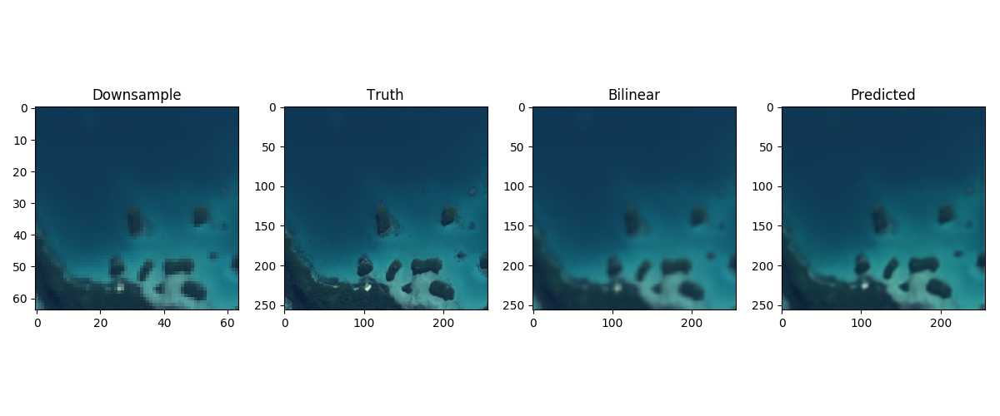

MSE, PSNR and SSIM for NN predicted:  60.23249816894531 30.332494847720714 0.9201164551388237
MSE, PSRN for SSIM Bilinear upsampling:  50.1285400390625 31.129953046133654 0.923631218460765
Class:  Terrestrial vegetation


<IPython.core.display.Javascript object>


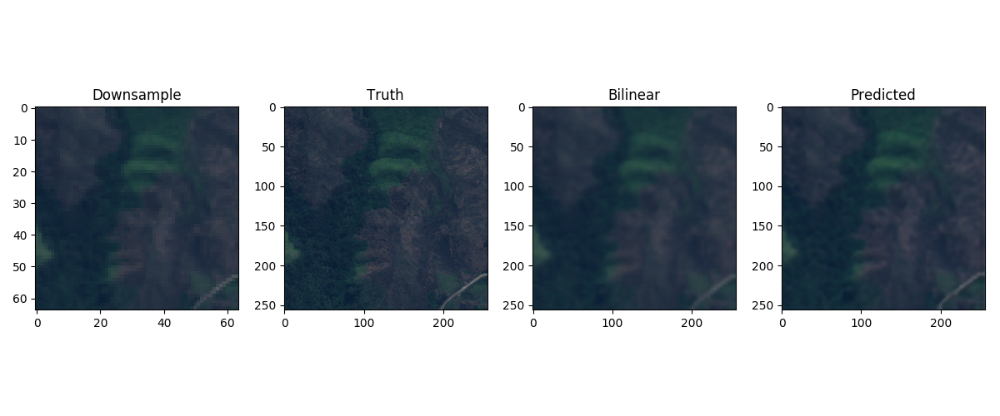

MSE, PSNR and SSIM for NN predicted:  108.81887817382812 27.763761164660764 0.780596553251977
MSE, PSRN for SSIM Bilinear upsampling:  112.63836669921875 27.61394016465642 0.7544557838833656
Class:  Lagoonal floor macroalgae on sediment


<IPython.core.display.Javascript object>


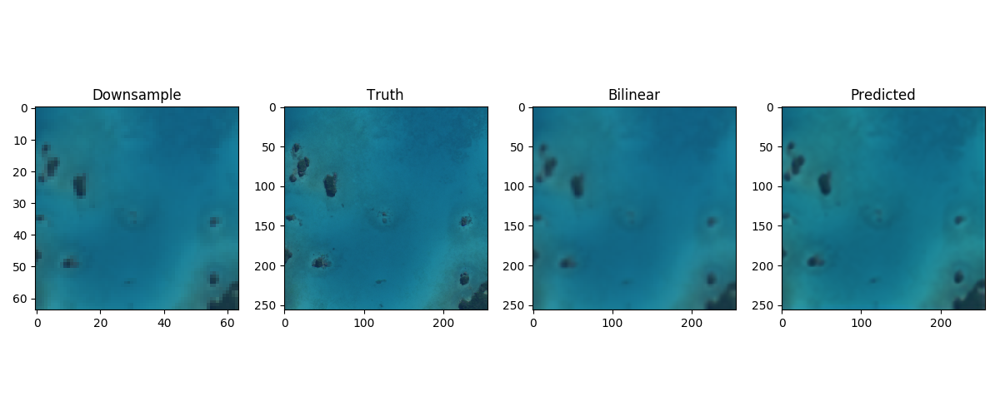

MSE, PSNR and SSIM for NN predicted:  62.32261657714844 30.18434682230971 0.9095355527168377
MSE, PSRN for SSIM Bilinear upsampling:  26.980331420898438 33.82033080714258 0.9461098005768729
Class:  Shallow fore reef terrace


<IPython.core.display.Javascript object>


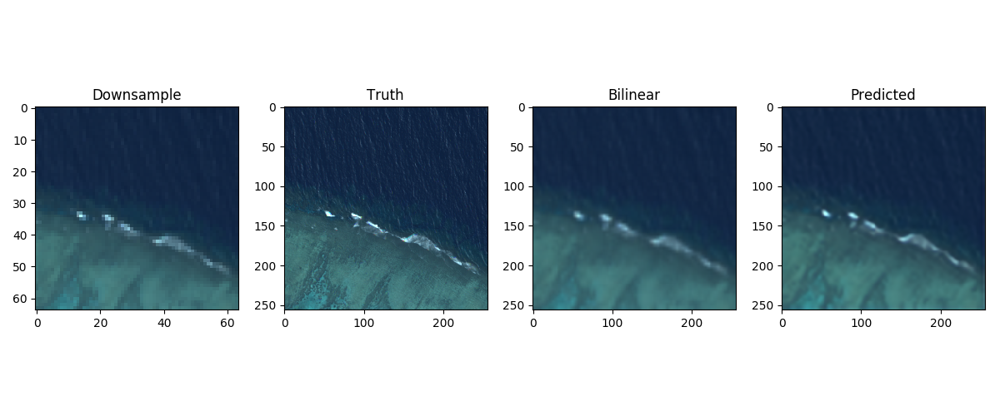

MSE, PSNR and SSIM for NN predicted:  84.16290283203125 28.879596547071067 0.7867831334997439
MSE, PSRN for SSIM Bilinear upsampling:  90.7103271484375 28.554236276306813 0.7565002955143979
Class:  Lagoonal floor barren


<IPython.core.display.Javascript object>


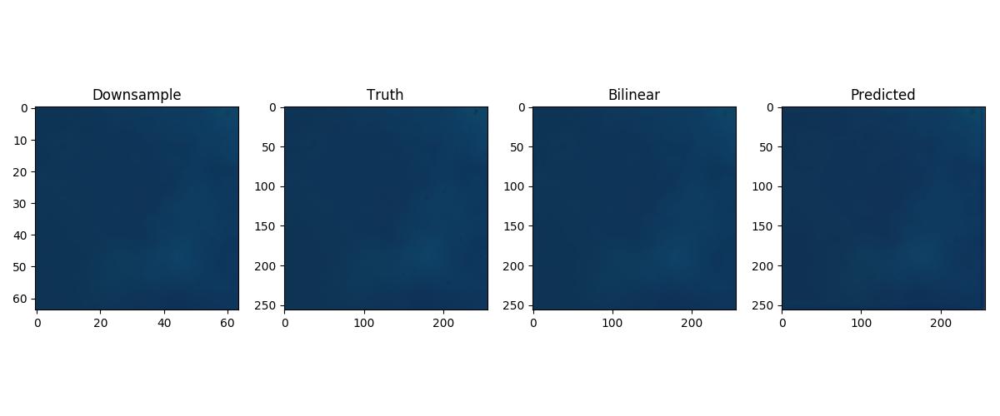

MSE, PSNR and SSIM for NN predicted:  10.192459106445312 38.04801383189708 0.988095404874814
MSE, PSRN for SSIM Bilinear upsampling:  1.7278900146484375 45.755642659839864 0.9933299923209937
Class:  Deep lagoonal water


/home/asli/NeMO-Test/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


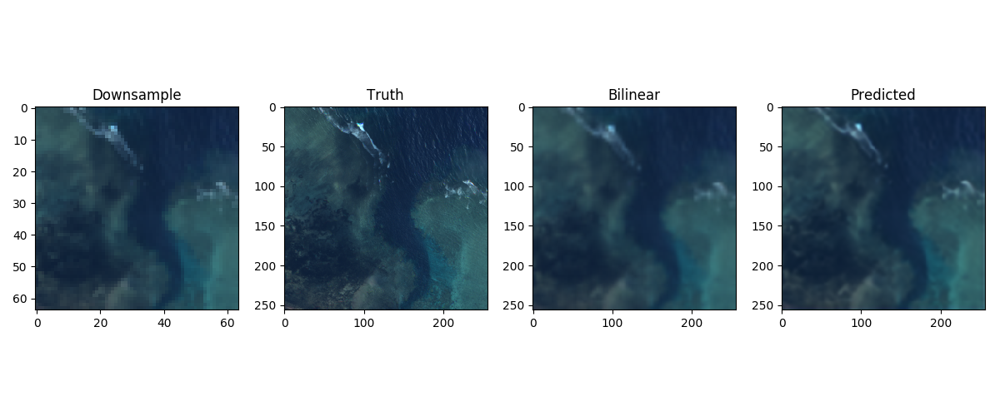

MSE, PSNR and SSIM for NN predicted:  60.61688232421875 30.30486765098383 0.8574362606505963
MSE, PSRN for SSIM Bilinear upsampling:  90.84446716308594 28.547818789069908 0.7974320100661523
Class:  Coralline algal ridge


<IPython.core.display.Javascript object>


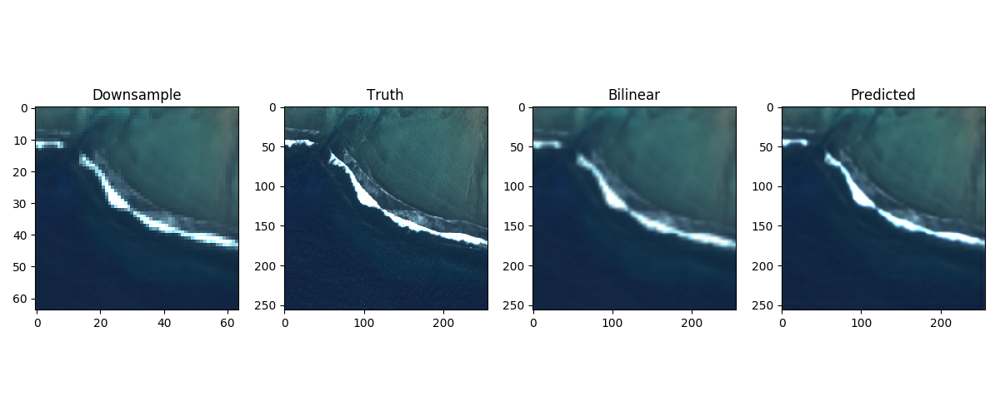

MSE, PSNR and SSIM for NN predicted:  74.62879943847656 29.401739057333607 0.8555702926565492
MSE, PSRN for SSIM Bilinear upsampling:  72.2188720703125 29.544296596276226 0.8428032395166101
Class:  Mangroves


<IPython.core.display.Javascript object>


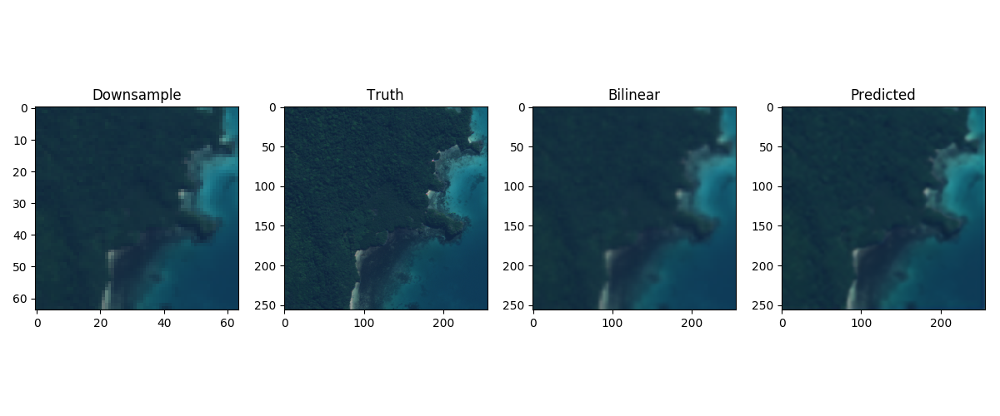

MSE, PSNR and SSIM for NN predicted:  115.00491333007812 27.52363965848573 0.7725582787928111
MSE, PSRN for SSIM Bilinear upsampling:  110.95103454589844 27.67949004768741 0.7682105717638157
Class:  Back reef pavement


<IPython.core.display.Javascript object>


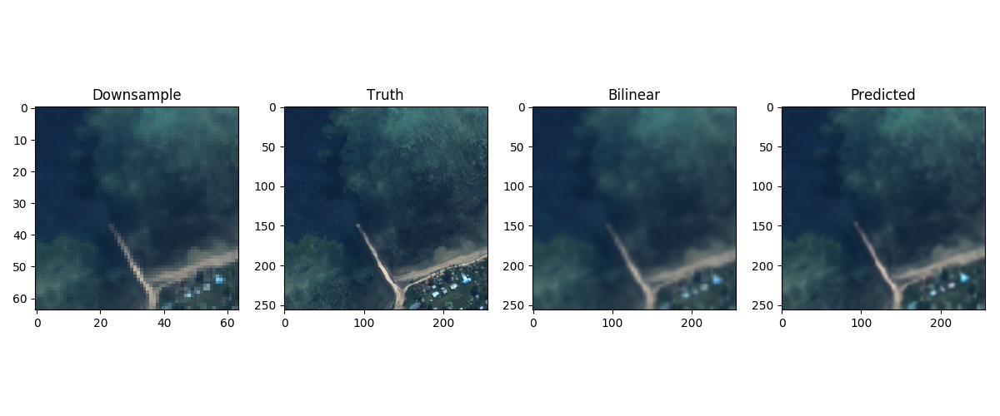

MSE, PSNR and SSIM for NN predicted:  88.19926452636719 28.676153972040275 0.8468550115778112
MSE, PSRN for SSIM Bilinear upsampling:  94.70703125 28.366981377282166 0.8188090315060758
Class:  Back reef coral bommies


<IPython.core.display.Javascript object>


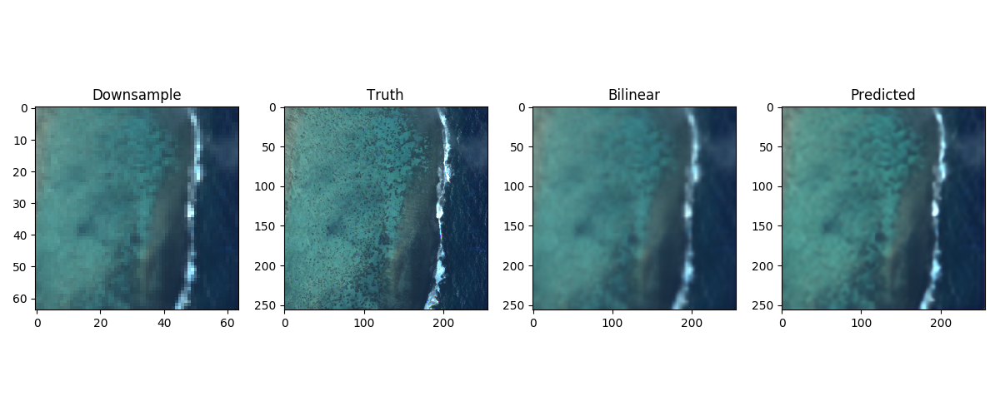

MSE, PSNR and SSIM for NN predicted:  170.3356170654297 25.81774892719403 0.6258869642619398
MSE, PSRN for SSIM Bilinear upsampling:  136.34388732910156 26.78444688768103 0.7041349752662076
Class:  Beach sand


<IPython.core.display.Javascript object>


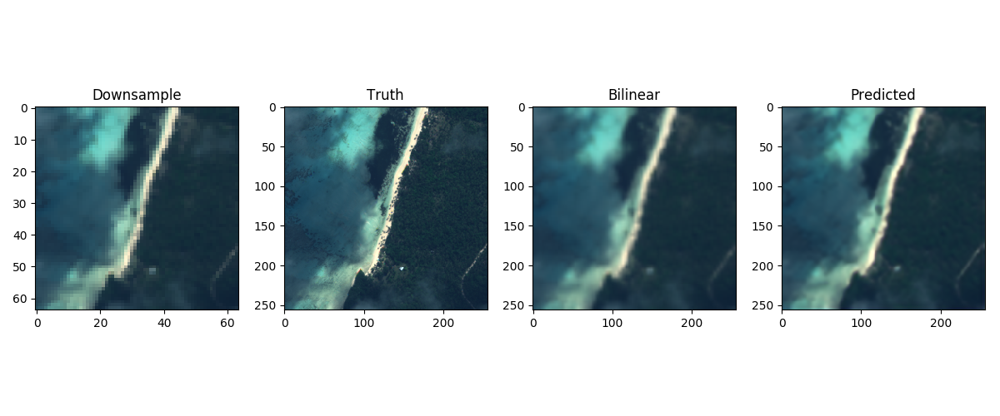

MSE, PSNR and SSIM for NN predicted:  147.3553466796875 26.44714462342247 0.7492033672314975
MSE, PSRN for SSIM Bilinear upsampling:  148.7235107421875 26.407007321005487 0.7450493238208873
Class:  Shallow fore reef slope


<IPython.core.display.Javascript object>


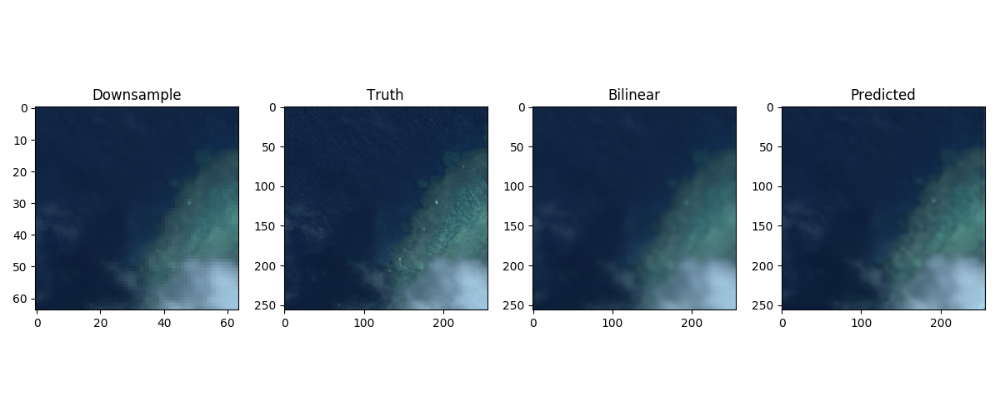

MSE, PSNR and SSIM for NN predicted:  51.78936767578125 30.988397523523417 0.9084318578746255
MSE, PSRN for SSIM Bilinear upsampling:  31.384231567382812 33.16368861308962 0.9216618265489434
Class:  Back reef coral framework


<IPython.core.display.Javascript object>


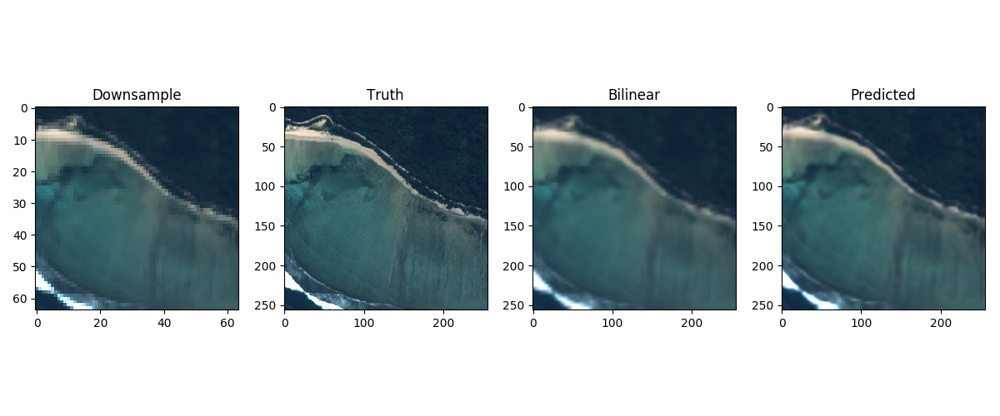

MSE, PSNR and SSIM for NN predicted:  126.48004150390625 27.110583614317836 0.7835468555289316
MSE, PSRN for SSIM Bilinear upsampling:  118.568359375 27.39111550272685 0.7890033191060066
Class:  Lagoonal sediment apron sediment dominated


<IPython.core.display.Javascript object>


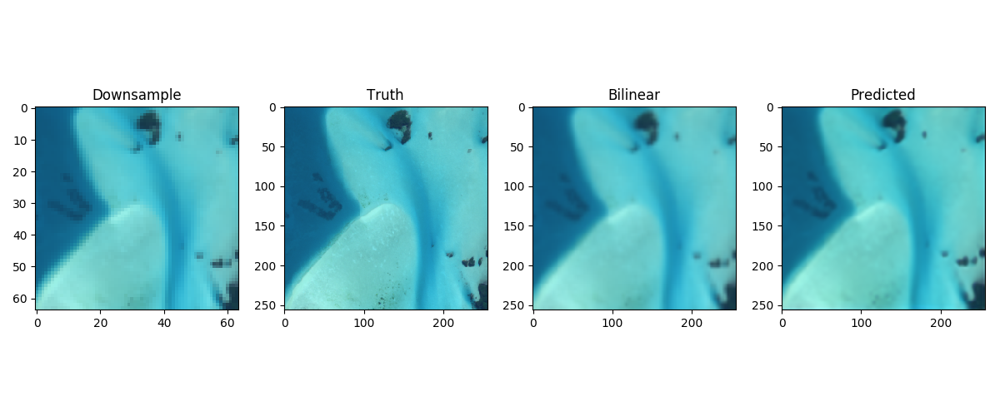

MSE, PSNR and SSIM for NN predicted:  115.71519470214844 27.496899704380404 0.869572931148048
MSE, PSRN for SSIM Bilinear upsampling:  64.57537841796875 30.03013401007393 0.9161278831906017
Class:  Clouds


<IPython.core.display.Javascript object>


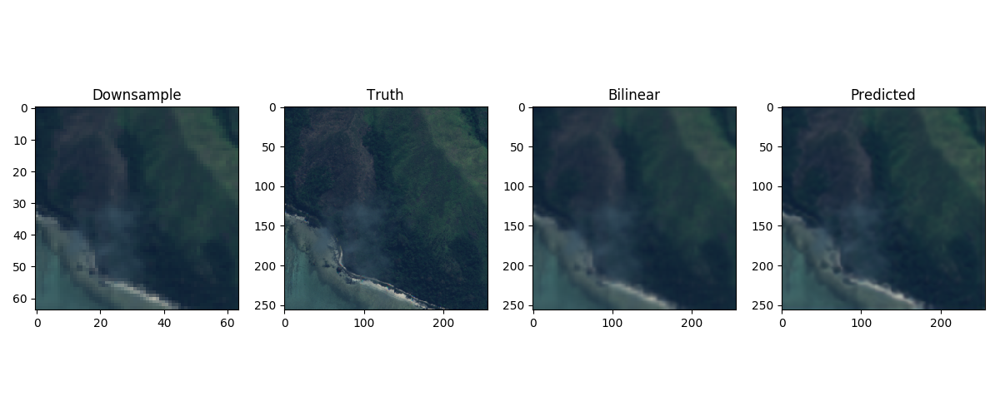

MSE, PSNR and SSIM for NN predicted:  94.84587097167969 28.360619318451008 0.8219593846300836
MSE, PSRN for SSIM Bilinear upsampling:  126.30754089355469 27.116510810117454 0.7354266772891995


In [36]:
# This code is for Fiji 8band converted to RGB
# imgpath = '../Images/Fiji_SR_ValidPatches_64/Lagoonal fringing reefs/Lagoonal fringing reefs_00000000.tif'
# truthpath = '../Images/Fiji_SR_ValidPatches_256/Lagoonal fringing reefs/Lagoonal fringing reefs_00000000.tif'
searchdir = "../Images/Fiji_SR_ValidPatches_64/"
hiresdir = "../Images/Fiji_SR_ValidPatches_256/"

pixel_mean = 100
pixel_std = 100
lores_size = 64
hires_size = 256
RGBchannels = [5,3,2]

figcount = 3

dir_list = [d for d in os.listdir(searchdir) if os.path.isdir(os.path.join(searchdir,d))]

for d in dir_list:
    print("Class: ", d)
    imgpath = searchdir + d + "/" + d + "_00000000.tif"
    truthpath = hiresdir + d + "/" + d + "_00000000.tif"

    origimg = loadrasterRGB(imgpath, RGBchannels)
    origimg = fixRGBimg(origimg,0,1,0,255)
    fullimg = loadrasterRGB(imgpath, [2,3,5,7])
    fullimg = fixRGBimg(fullimg,0,1,0,255)
    trueimg = loadrasterRGB(truthpath, RGBchannels)
    trueimg = fixRGBimg(trueimg,0,1,0,255)
    imgtruth = loadrasterRGB(truthpath, [2,3,5,7])
    imgtruth = fixRGBimg(imgtruth,0,1,0,255)

    imgresize_RGB = scipy.misc.imresize(origimg,400,'bilinear')
    imgresize_NIR = scipy.misc.imresize(fullimg[:,:,3],400,'bilinear')
    imgresize = np.dstack((imgresize_RGB[:,:,2::-1], imgresize_NIR))
    # fullimgresize = scipy.misc.imresize(fullimg,400,'bilinear') # can't resize 8 channel array

    testimg = loadrasterRGB(imgpath, [2,3,5,7])
    testimg = img_to_array(testimg, data_format=K.image_data_format())
    testimg = (testimg-pixel_mean)/pixel_std
    imgbatch = np.expand_dims(testimg, axis=0)
    imgpredict = model.predict(imgbatch, batch_size = 1)[0]
    imgpredict = fixRGBimg(imgpredict,pixel_mean,pixel_std,0,255)
    imgpredict_fix = np.zeros((imgpredict.shape[0],imgpredict.shape[1],3))
    imgpredict_fix[:,:,0] = imgpredict[:,:,2]
    imgpredict_fix[:,:,1] = imgpredict[:,:,1]
    imgpredict_fix[:,:,2] = imgpredict[:,:,0]
    imgpredict_fix = np.asarray(imgpredict_fix, dtype=np.uint8)

    fig = plt.figure(figcount, figsize=(12,5))
    ax1 = fig.add_subplot(1,4,1)
    ax1.imshow(origimg)
    ax1.set_title("Downsample")

    ax2 = fig.add_subplot(1,4,2)
    ax2.imshow(trueimg)
    ax2.set_title("Truth")

    ax3 = fig.add_subplot(1,4,3)
    ax3.imshow(imgresize[:,:,2::-1])
    ax3.set_title("Bilinear")

    ax4 = fig.add_subplot(1,4,4)
    ax4.imshow(imgpredict[:,:,2::-1])
    ax4.set_title("Predicted")
    fig.tight_layout()
    plt.show()

    figcount += 1
    # Only do this for RGB

    MSE1 = np.sum(np.square(imgpredict - imgtruth))/(hires_size*hires_size)
    MSE2 = np.sum(np.square(imgresize - imgtruth))/(hires_size*hires_size)
    PSNR1 = 10*np.log10(255*255/MSE1)
    PSNR2 = 10*np.log10(255*255/MSE2)
    SSIM1 = ssim(imgpredict, imgtruth, multichannel=True)
    SSIM2 = ssim(imgresize, imgtruth, multichannel=True)
    
    print("MSE, PSNR and SSIM for NN predicted: ", MSE1, PSNR1, SSIM1)
    print("MSE, PSRN for SSIM Bilinear upsampling: ", MSE2, PSNR2, SSIM2)
    

{'Coral': 1, 'Sediment': 2, 'Beach': 3, 'Seagrass': 4, 'Terrestrial vegetation': 5, 'Deep water': 6, 'Clouds': 7, 'Wave breaking': 8, 'Other or Unknown': 9}


<IPython.core.display.Javascript object>


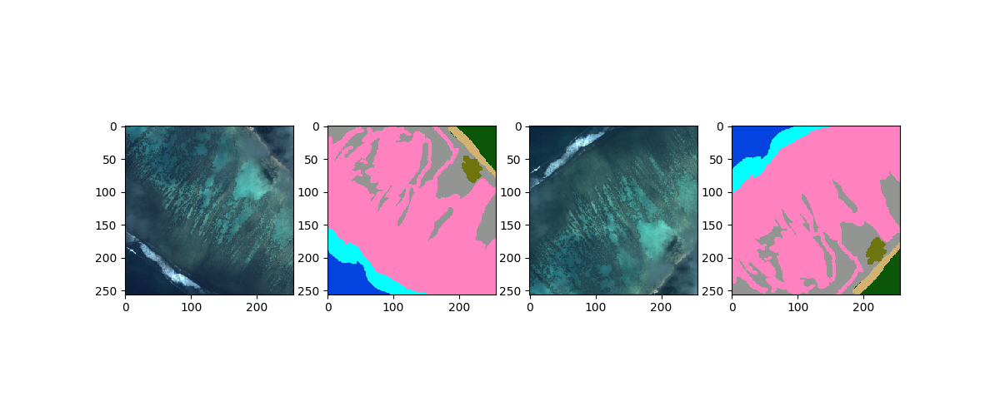

In [4]:
# Load sample Jarrett data and visualize

RGBchannels = [5,3,2]
jsonpath = './utils/CoralClasses.json'
with open(jsonpath) as json_file:
    json_data = json.load(json_file)
    
class_indices = json_data["VedConsolidated_ClassDict"]
print(class_indices)
num_consolclass = len(class_indices)
min_labelkey = 1

OrigJarrettPath = "../Images/Jarrett_Training_Patches/Coral/Coral_00000017.tif"
OrigJarrettRGB = loadrasterRGB(OrigJarrettPath, RGBchannels)
OrigJarrettRGB = fixRGBimg(OrigJarrettRGB,100,100,0,255)
JarrettPath = "./Generator_Outputs/_trainimg_0_17.tif"
JarrettRGB = loadrasterRGB(JarrettPath, [3,2,1])
JarrettRGB = fixRGBimg(JarrettRGB,100,100,0,255)

cmap_Ved = colors.ListedColormap(['xkcd:pink', 'xkcd:grey', 'xkcd:tan', 'xkcd:olive', 'xkcd:forest', 'xkcd:blue',
                                'xkcd:lilac', 'xkcd:cyan', 'xkcd:orange'])
bounds = [i-0.5 for i in range(len(cmap_Ved.colors)+1)] # assumes labels start at 0
norm = colors.BoundaryNorm([b+0.5 for b in bounds], cmap_Ved.N)

OrigJarrettTruthPath = "../Images/Jarrett_TrainingRef_Patches/Coral/Coral_00000017.png"
OrigJarrettTruth = np.asarray(cv2.imread(OrigJarrettTruthPath, cv2.IMREAD_GRAYSCALE), dtype=np.uint8)
JarrettTruthPath = "./Generator_Outputs/_labelimg_0_17.png"
JarrettTruth = np.asarray(cv2.imread(JarrettTruthPath, cv2.IMREAD_GRAYSCALE), dtype=np.uint8)

labelkey = [np.uint8(255/num_consolclass*i) for i in range(min_labelkey, min_labelkey+num_consolclass)] # Assuming labels are saved according to # of consolclass
item_counter = 0
for item in labelkey:
    JarrettTruth[JarrettTruth == item] = class_indices[list(class_indices.keys())[item_counter]] - min_labelkey # Set 0-255 gray level to 0-num_consolclass
    OrigJarrettTruth[OrigJarrettTruth == item] = class_indices[list(class_indices.keys())[item_counter]] - min_labelkey # Set 0-255 gray level to 0-num_consolclass
    item_counter+=1
    
fig = plt.figure(3, figsize=(12,5))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(OrigJarrettRGB)

ax2 = fig.add_subplot(1,4,2)
ax2.imshow(OrigJarrettTruth, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax3 = fig.add_subplot(1,4,3)
ax3.imshow(JarrettRGB)

ax4 = fig.add_subplot(1,4,4)
ax4.imshow(JarrettTruth, interpolation='nearest', cmap=cmap_Ved, norm=norm)
plt.show()


/home/asli/NeMO-Test/lib/python3.6/site-packages/ipykernel_launcher.py:35: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
/home/asli/NeMO-Test/lib/python3.6/site-packages/ipykernel_launcher.py:27: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


<IPython.core.display.Javascript object>


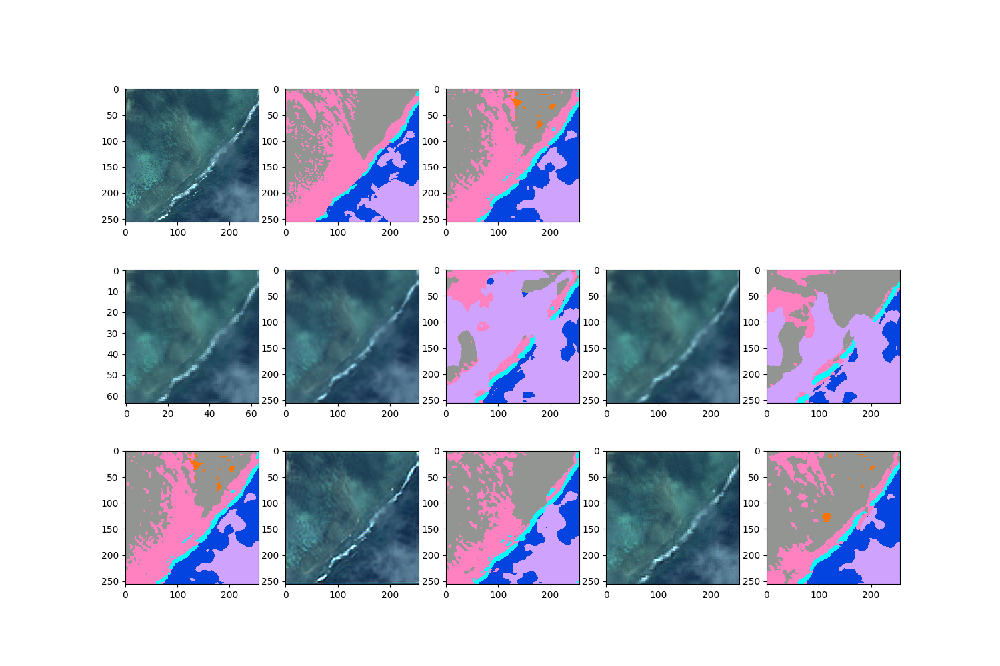

In [24]:
def classifyback(predictions):
    return np.argmax(predictions,-1)

JarrettPath = "./Generator_Outputs/_trainimg_0_26.tif" # Originally in BGR
JarrettTruthPath = "./Generator_Outputs/_labelimg_0_26.png"
Jarrett_patch = loadrasterRGB(JarrettPath, [1,2,3,4])
JarrettTruth = np.asarray(cv2.imread(JarrettTruthPath, cv2.IMREAD_GRAYSCALE), dtype=np.uint8)
labelkey = [np.uint8(255/num_consolclass*i) for i in range(min_labelkey, min_labelkey+num_consolclass)] # Assuming labels are saved according to # of consolclass
item_counter = 0
for item in labelkey:
    JarrettTruth[JarrettTruth == item] = class_indices[list(class_indices.keys())[item_counter]] - min_labelkey # Set 0-255 gray level to 0-num_consolclass
    item_counter+=1
JarrettRGB = loadrasterRGB(JarrettPath, [3,2,1])
JarrettRGB = fixRGBimg(JarrettRGB,100,100,0,255)

# Predict on original
Jarrettbatch = np.expand_dims(Jarrett_patch, axis=0) # This is in BGR + NIR
Jarrettpredict = Jarrett_4channel_model.predict(Jarrettbatch, batch_size = 1)[0]
Jarrettpredict = np.reshape(classifyback(Jarrettpredict), (256,256))

Jarrett_lores = raster_lores(JarrettPath, 0.25)
Jarrett_lores_patch = Jarrett_lores[:,:,2::-1] # Turn to RGB
Jarrett_lores_RGB = fixRGBimg(Jarrett_lores_patch, 100, 100, 0, 255)

Jarrett_bilinear = np.zeros((256,256,4), dtype=np.float)
for i in range(Jarrett_lores.shape[2]):
    Jarrett_bilinear[:,:,i] = scipy.misc.imresize(fixRGBimg(Jarrett_lores[:,:,i],100,100,0,255), 400, 'bilinear')
Jarrett_bilinear_RGB = np.asarray(Jarrett_bilinear[:,:,2::-1], dtype=np.uint8)
    
Jarrett_SRx4_batch = np.expand_dims(Jarrett_lores, axis=0)
Jarrett_SRx4_batch2 = np.expand_dims(Jarrett_patch, axis=0)
Jarrett_SRx4_predict = supermodel.predict(Jarrett_SRx4_batch, batch_size = 1)[0]
Jarrett_SRx4_RGB_predict = fixRGBimg(Jarrett_SRx4_predict[:,:,2::-1], 100, 100, 0, 255)

Jarrett_bilinear_batch = np.expand_dims((np.asarray(Jarrett_bilinear,dtype=np.float)-100)/100, axis=0)
bilinear_predict = Jarrett_4channel_model.predict(Jarrett_bilinear_batch, batch_size = 1)[0]
bilinear_predict = np.reshape(classifyback(bilinear_predict), (256,256))

SRpredictbatch = np.expand_dims(Jarrett_SRx4_predict, axis=0)
SRpredict = Jarrett_4channel_model.predict(SRpredictbatch, batch_size = 1)[0]
SRpredict = np.reshape(classifyback(SRpredict), (256,256))

fig = plt.figure(4, figsize=(15,10))
ax1 = fig.add_subplot(3,5,1)
ax1.imshow(JarrettRGB)

ax2 = fig.add_subplot(3,5,2)
ax2.imshow(JarrettTruth, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax3 = fig.add_subplot(3,5,3)
ax3.imshow(Jarrettpredict, interpolation='nearest', cmap=cmap_Ved, norm=norm)
plt.show()

# fig = plt.figure(5, figsize=(14,4))
ax1 = fig.add_subplot(3,5,6)
ax1.imshow(Jarrett_lores_RGB)

ax2 = fig.add_subplot(3,5,7)
ax2.imshow(Jarrett_SRx4_RGB_predict)

ax3 = fig.add_subplot(3,5,8)
ax3.imshow(SRpredict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax4 = fig.add_subplot(3,5,9)
ax4.imshow(Jarrett_bilinear_RGB)

ax5 = fig.add_subplot(3,5,10)
ax5.imshow(bilinear_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)


# Sharpening Code
kernel_sharpening = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

Jarrett_SRx4_predict_sharpen = np.zeros(Jarrett_SRx4_predict.shape)
Jarrett_bilinear_sharpen = np.zeros(Jarrett_bilinear.shape)

for i in range(4):
    Jarrett_SRx4_predict_sharpen[:,:,i] = cv2.filter2D(Jarrett_SRx4_predict[:,:,i], -1, kernel_sharpening)
#     gaussian = cv2.GaussianBlur(Jarrett_SRx4_predict[:,:,i], (9,9), 5)
#     Jarrett_SRx4_predict_sharpen[:,:,i] = cv2.addWeighted(Jarrett_SRx4_predict[:,:,i], 1, Jarrett_SRx4_predict[:,:,i]-gaussian, 1, 0)
    Jarrett_bilinear_sharpen[:,:,i] = cv2.filter2D(Jarrett_bilinear[:,:,i], -1, kernel_sharpening)
    
Jarrett_SRx4_predict_sharpen_RGB = fixRGBimg(Jarrett_SRx4_predict_sharpen[:,:,2::-1], 100, 100, 0, 255)
Jarrett_bilinear_sharpen_RGB = fixRGBimg(Jarrett_bilinear_sharpen[:,:,2::-1], 0, 1, 0, 255)

SR_sharpen_predictbatch = np.expand_dims(Jarrett_SRx4_predict_sharpen, axis=0)
SR_sharpen_predict = Jarrett_4channel_model.predict(SR_sharpen_predictbatch, batch_size = 1)[0]
SR_sharpen_predict = np.reshape(classifyback(SR_sharpen_predict), (256,256))

bilinear_sharpen_predictbatch = np.expand_dims((np.asarray(Jarrett_bilinear_sharpen,dtype=np.float)-100)/100, axis=0)
bilinear_sharpen_predict = Jarrett_4channel_model.predict(bilinear_sharpen_predictbatch, batch_size = 1)[0]
bilinear_sharpen_predict = np.reshape(classifyback(bilinear_sharpen_predict), (256,256))

# fig = plt.figure(6, figsize=(12,4))
ax1 = fig.add_subplot(3,5,11)
ax1.imshow(Jarrettpredict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax2 = fig.add_subplot(3,5,12)
ax2.imshow(Jarrett_SRx4_predict_sharpen_RGB)

ax3 = fig.add_subplot(3,5,13)
ax3.imshow(SR_sharpen_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax4 = fig.add_subplot(3,5,14)
ax4.imshow(Jarrett_bilinear_sharpen_RGB)

ax5 = fig.add_subplot(3,5,15)
ax5.imshow(bilinear_sharpen_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

plt.show()


In [25]:
accuracy = 100*np.asarray(Jarrettpredict == JarrettTruth).astype(np.float32).sum()/(JarrettTruth.shape[0]*JarrettTruth.shape[1]) # this is not correct when truth_predict does not start from 0
print(accuracy)

accuracy_SR = 100*np.asarray(SR_sharpen_predict == JarrettTruth).astype(np.float32).sum()/(JarrettTruth.shape[0]*JarrettTruth.shape[1]) # this is not correct when truth_predict does not start from 0
print(accuracy_SR)

accuracy_bilinear = 100*np.asarray(bilinear_sharpen_predict == JarrettTruth).astype(np.float32).sum()/(JarrettTruth.shape[0]*JarrettTruth.shape[1]) # this is not correct when truth_predict does not start from 0
print(accuracy_bilinear)

84.5458984375
78.86962890625
77.28271484375


<IPython.core.display.Javascript object>


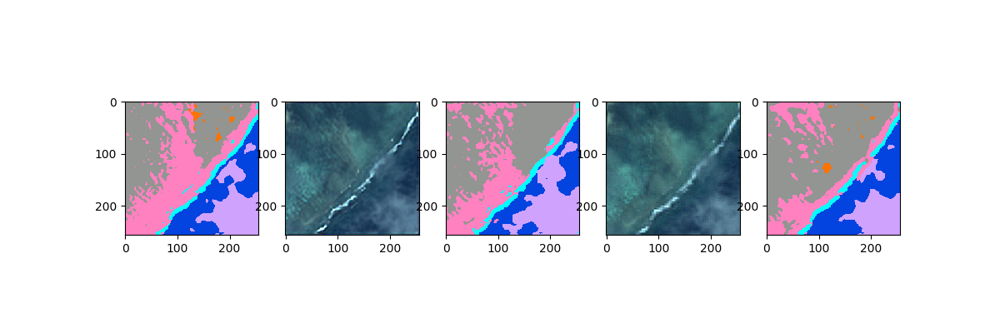

In [53]:
kernel_sharpening = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

Jarrett_SRx4_predict_sharpen = np.zeros(Jarrett_SRx4_predict.shape)
Jarrett_bilinear_sharpen = np.zeros(Jarrett_bilinear.shape)

for i in range(4):
    Jarrett_SRx4_predict_sharpen[:,:,i] = cv2.filter2D(Jarrett_SRx4_predict[:,:,i], -1, kernel_sharpening)
#     gaussian = cv2.GaussianBlur(Jarrett_SRx4_predict[:,:,i], (9,9), 5)
#     Jarrett_SRx4_predict_sharpen[:,:,i] = cv2.addWeighted(Jarrett_SRx4_predict[:,:,i], 1, Jarrett_SRx4_predict[:,:,i]-gaussian, 1, 0)
    Jarrett_bilinear_sharpen[:,:,i] = cv2.filter2D(Jarrett_bilinear[:,:,i], -1, kernel_sharpening)
    
Jarrett_SRx4_predict_sharpen_RGB = fixRGBimg(Jarrett_SRx4_predict_sharpen[:,:,2::-1], 100, 100, 0, 255)
Jarrett_bilinear_sharpen_RGB = fixRGBimg(Jarrett_bilinear_sharpen[:,:,2::-1], 0, 1, 0, 255)

SR_sharpen_predictbatch = np.expand_dims(Jarrett_SRx4_predict_sharpen, axis=0)
SR_sharpen_predict = Jarrett_4channel_model.predict(SR_sharpen_predictbatch, batch_size = 1)[0]
SR_sharpen_predict = np.reshape(classifyback(SR_sharpen_predict), (256,256))

bilinear_sharpen_predictbatch = np.expand_dims((np.asarray(Jarrett_bilinear_sharpen,dtype=np.float)-100)/100, axis=0)
bilinear_sharpen_predict = Jarrett_4channel_model.predict(bilinear_sharpen_predictbatch, batch_size = 1)[0]
bilinear_sharpen_predict = np.reshape(classifyback(bilinear_sharpen_predict), (256,256))

fig = plt.figure(6, figsize=(12,4))
ax1 = fig.add_subplot(1,5,1)
ax1.imshow(Jarrettpredict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax2 = fig.add_subplot(1,5,2)
ax2.imshow(Jarrett_SRx4_predict_sharpen_RGB)

ax3 = fig.add_subplot(1,5,3)
ax3.imshow(SR_sharpen_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

ax4 = fig.add_subplot(1,5,4)
ax4.imshow(Jarrett_bilinear_sharpen_RGB)

ax5 = fig.add_subplot(1,5,5)
ax5.imshow(bilinear_sharpen_predict, interpolation='nearest', cmap=cmap_Ved, norm=norm)

# print(Jarrett_SRx4_predict)
# y =33
# x = 9

# print("Lores: ", Jarrett_lores_RGB[y,x])
# print("Original: ", JarrettRGB[y*4,x*4])
# print("NN Predicted: ", Jarrett_SRx4_RGB_predict[y*4,x*4])
# print("Bilinear: ", Jarrett_bilinear_RGB[y*4,x*4])

In [65]:
print(Fiji_Sentinel.geotransform)

(249118.0, 10.0, 0.0, 8041246.0, 0.0, -10.0)
